<a href="https://colab.research.google.com/github/burning-river/epithelium_segmentation/blob/main/train_unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/dl_tutorial/epithelium/epi')

In [3]:
dataname="epistroma"
gpuid=0

# --- unet params
n_classes= 2    # Class 1: epithelium cells, Class 0: background
in_channels= 3  # input channel of the data, RGB = 3
padding= True   # should images be padded
depth= 5       # depth of the network
wf= 2           # weight factor (int): number of filters/kernels in the first layer is 2**wf
up_mode= 'upconv' # should we simply upsample the mask, or should we try and learn an interpolation
batch_norm = True # should we use batch normalization between the layers

# --- training params
batch_size=5 # number of images in a batch
patch_size=256 # size of the patches used for training
num_epochs = 100 # number of passes through the training set
phases = ["train","val"] # phases while training
validation_phases= ["val"] # performing validation only on validation set since it is time consuming


In [4]:
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.4 MB/s eta 0:00:00


In [5]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms

import sklearn.feature_extraction.image

from unet import UNet # code borrowed from https://github.com/jvanvugt/pytorch-unet

import PIL
import matplotlib.pyplot as plt
import cv2

import numpy as np
import sys, glob

from tensorboardX import SummaryWriter # web UI tool to visualize tensorflow results

import scipy.ndimage

import time
import math
import tables

import random
from matplotlib.figure import Figure

from sklearn.metrics import confusion_matrix
import regex as re

In [ ]:
def asMinutes(s):
    '''
    converts seconds to minutes and seconds
    '''
    m = math.floor(s / 60) # minutes
    s -= m * 60 # remaining seconds (0 - 59)
    return '%dm %ds' % (m, s)
def timeSince(since, percent):
    '''
    calculates estimated time remaining for training
    Args:
        since: time since start
        percent: percentage of training completed
    '''
    now = time.time() # current time
    time_since = now - since # time since start
    est_train_time = time_since / (percent+.00001) # estimated total time for training
    est_rem_time = est_train_time - time_since # estimated time remaining
    return '%s (- %s)' % (asMinutes(time_since), asMinutes(est_rem_time))

In [6]:
#specify if we should use a GPU (cuda) or only the CPU
if(torch.cuda.is_available()):
    print(torch.cuda.get_device_properties(gpuid))
    torch.cuda.set_device(gpuid)
    device = torch.device(f'cuda:{gpuid}')
else:
    device = torch.device(f'cpu')

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


In [11]:
#build the model according to the paramters specified above and copy it to the GPU. finally print out the number of trainable parameters
model = UNet(n_classes=n_classes, in_channels=in_channels, padding=padding,depth=depth,wf=wf, up_mode=up_mode, batch_norm=batch_norm).to(device)
print(f"total params: \t{sum([np.prod(p.size()) for p in model.parameters()])}")

total params: 	122466


In [7]:
# creating a class Dataset for Pytorch to read the dataset
class Dataset:
    def __init__(self, fname ,img_transform=None, mask_transform = None):
        # initializing filename, transformation of image and mask
        self.fname=fname

        self.img_transform=img_transform
        self.mask_transform = mask_transform

        t=tables.open_file(self.fname)
        self.numpixels=t.root.numpixels[:]
        self.nitems=t.root.img.shape[0]
        t.close()

        self.img = None
        self.mask = None

    def __getitem__(self, index):
        with tables.open_file(self.fname,'r') as db:
            self.img=db.root.img
            self.mask=db.root.mask

            # getting the requested image and mask from the pytable
            img = self.img[index,:,:,:]
            mask = self.mask[index,:,:]

        # transforming mask from 2D to 3D for data augmentation in pytorch
        mask = mask[:,:,None].repeat(3,axis=2)

        img_new = img
        mask_new = mask

        seed = random.randrange(sys.maxsize) # get a random seed so that we can reproducibly do the transformations
        # transforming image
        if self.img_transform is not None:
            torch.manual_seed(seed)
            img_new = self.img_transform(img)

        # transforming mask
        if self.mask_transform is not None:
            torch.manual_seed(seed)
            mask_new = self.mask_transform(mask)
            # converting transformed mask to 1D
            mask_new = np.asarray(mask_new)[:,:,0].squeeze()

        return img_new, mask_new

    def __len__(self):
        return self.nitems

In [8]:
# transformations for data augmentation
img_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomVerticalFlip(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(size=(patch_size,patch_size),pad_if_needed=True), # crop patch of size equal to input size to UNet
    transforms.RandomResizedCrop(size=patch_size), # increase/decrease magnification and then resize to input size
    transforms.RandomRotation(180),
    transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=.5),
    transforms.RandomGrayscale(),
    # convert data to (batch_size, x_size, y_size, n_channels) and normalize pixel values to (0,1)
    transforms.ToTensor()
    ])


mask_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomVerticalFlip(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(size=(patch_size,patch_size),pad_if_needed=True),
    transforms.RandomResizedCrop(size=patch_size,interpolation=PIL.Image.NEAREST),
    transforms.RandomRotation(180),
    ])

# Visualizations

In total, there are 37 patients in training set and 5 in validation set. For each patient, 100 patches were extracted. Let's visualize some patches (500 x 500 x 3) and corresponding masks (500 x 500 x 1) before training the model.

In [9]:
train_table=tables.open_file('./save/epistroma_train.pytable')
val_table=tables.open_file('./save/epistroma_val.pytable')

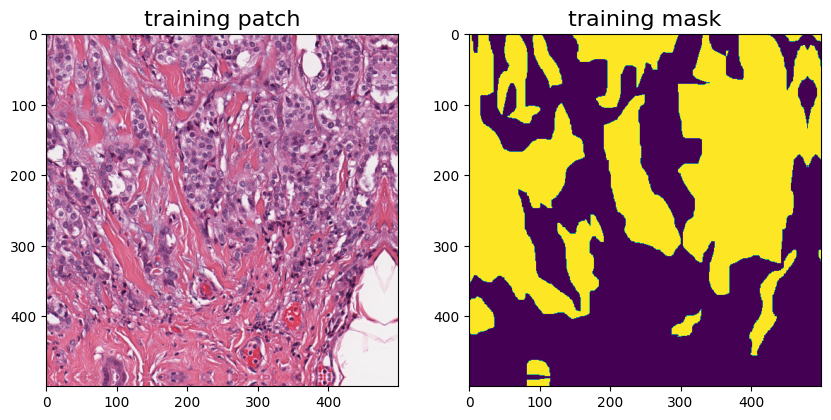

In [ ]:
fig = Figure(figsize=(10,5))
ax = fig.add_subplot(1,2,1)
i = random.randint(0, len(train_table.root.img)-1) # randomly select a patch
img = train_table.root.img[i]
ax.set_title('training patch', fontsize = 16)
ax.imshow(img)

ax = fig.add_subplot(1,2,2)
mask = train_table.root.mask[i]
ax.imshow(mask)
ax.set_title('training mask', fontsize = 16)
fig

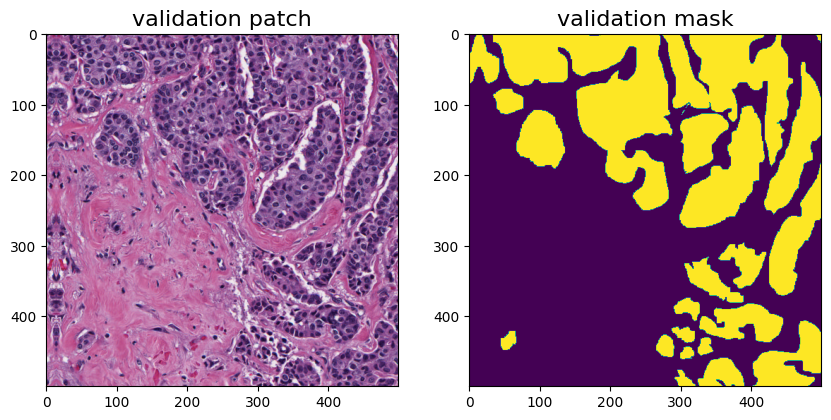

In [ ]:
fig = Figure(figsize=(10,5))
ax = fig.add_subplot(1,2,1)
i = random.randint(0, len(val_table.root.img)-1) # randomly select a patch
img = val_table.root.img[i]
ax.set_title('validation patch', fontsize = 16)
ax.imshow(img)

ax = fig.add_subplot(1,2,2)
mask = val_table.root.mask[i]
ax.imshow(mask)
ax.set_title('validation mask', fontsize = 16)
fig

Now let's apply transformations to see if we have the right masks for the 256 x 256 x 3 patches which the unet will be trained on.

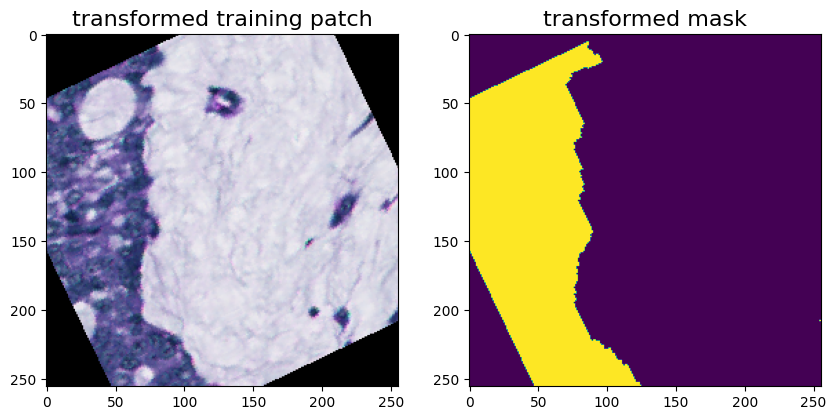

In [ ]:
seed = random.randrange(sys.maxsize)
fig = Figure(figsize=(10,5))
ax = fig.add_subplot(1,2,1)
torch.manual_seed(seed)
img = train_table.root.img[i]
patch = img_transform(img)
patch_new = np.moveaxis(patch.numpy(),0,-1)
ax.set_title('transformed training patch', fontsize = 16)
ax.imshow(patch_new)

ax = fig.add_subplot(1,2,2)
torch.manual_seed(seed)
mask = train_table.root.mask[i]
mask_new = mask_transform(mask)
ax.set_title('transformed mask', fontsize = 16)
ax.imshow(mask_new)
fig

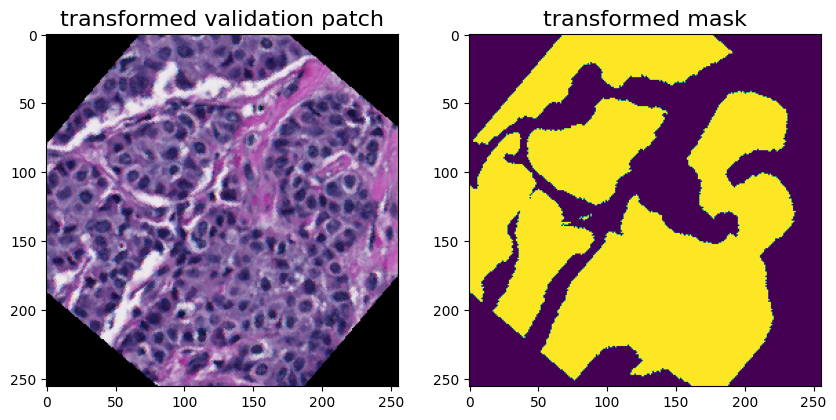

In [ ]:
seed = random.randrange(sys.maxsize)
fig = Figure(figsize=(10,5))
ax = fig.add_subplot(1,2,1)
torch.manual_seed(seed)
img = val_table.root.img[i]
patch = img_transform(img)
patch_new = np.moveaxis(patch.numpy(),0,-1)
ax.set_title('transformed validation patch', fontsize = 16)
ax.imshow(patch_new)

ax = fig.add_subplot(1,2,2)
torch.manual_seed(seed)
mask = val_table.root.mask[i]
mask_new = mask_transform(mask)
ax.set_title('transformed mask', fontsize = 16)
ax.imshow(mask_new)
fig

In [15]:
dataset={}
dataLoader={}
for phase in phases:
    # creating Dataset object for training and validation sets along with specifying transformations
    dataset[phase]=Dataset(f"./save/{dataname}_{phase}.pytable", img_transform=img_transform , mask_transform = mask_transform )
    # loads training data and divides it into batches
    dataLoader[phase]=DataLoader(dataset[phase], batch_size=batch_size,
                                shuffle=True, num_workers=2, pin_memory=True)

One last check to ascertain that the training and validation patches have the right masks from the dataloader

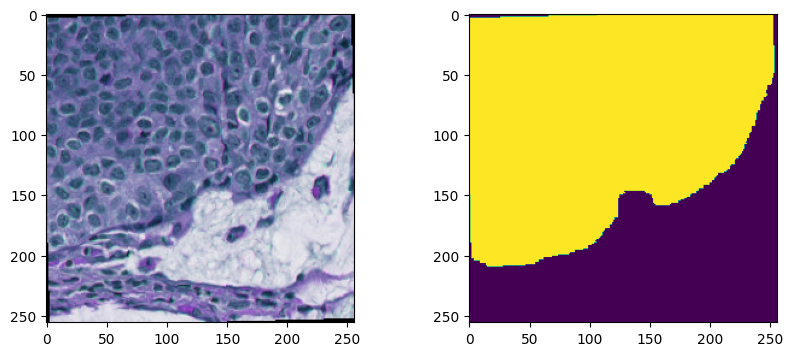

In [ ]:
i = random.randint(0, dataset["train"].nitems-1) # randomly select a patch
(img,patch_mask)=dataset["train"][i]
fig, ax = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns

ax[0].imshow(np.moveaxis(img.numpy(),0,-1))
ax[1].imshow(patch_mask)

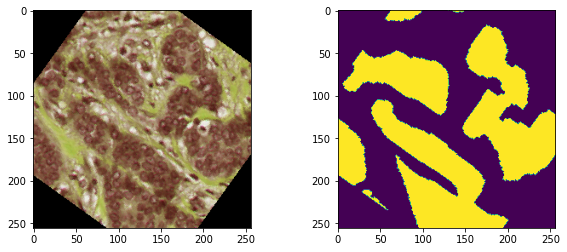

In [ ]:
i = random.randint(0, dataset["val"].nitems-1) # randomly select a patch
(img,patch_mask)=dataset["val"][i]
fig, ax = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns

ax[0].imshow(np.moveaxis(img.numpy(),0,-1))
ax[1].imshow(patch_mask)

In [ ]:
optim = torch.optim.Adam(model.parameters()) # gradient descent optimizer

In [ ]:
# Calculating the distribution of background (stroma) and foreground (epithelium) pixels
# Using the distribution, we'll upweigh minority class and downweigh majority class
nclasses = dataset["train"].numpixels.shape[1]
class_weight=dataset["train"].numpixels[1]
print(f'fraction of pixels (class 0) = {round(class_weight[0]/class_weight.sum(),3)}, \
fraction of pixels (class 1) = {round(class_weight[1]/class_weight.sum(),3)}')
class_weight = torch.from_numpy(1-class_weight/class_weight.sum()).type('torch.FloatTensor').to(device)

w0 = class_weight.cpu().numpy()[0]
w1 = class_weight.cpu().numpy()[1]
print('class weight (class 0) = ', round(w0,3), 'class weight (class 1) = ', round(w1,3))
criterion = nn.CrossEntropyLoss(weight = class_weight, reduction='none')
# reduce = None makes sure we get a 2D output instead of a 1D "summary" value

fraction of pixels (class 0) = 0.677, fraction of pixels (class 1) = 0.323
class weight (class 0) =  0.323 class weight (class 1) =  0.677


In [ ]:
# open the tensorboard visualiser to store performance scores per epoch
writer=SummaryWriter()
best_loss_on_test = np.Infinity
start_time = time.time()
for epoch in range(num_epochs):
    # initializing performance metrics to 0 for each epoch
    all_acc = {key: 0 for key in phases}
    all_loss = {key: torch.zeros(0).to(device) for key in phases}
    cmatrix = {key: np.zeros((2,2)) for key in phases}

    phase = 'train'
    model.train()

   # iterating over batches
    for ii , (X, y) in enumerate(dataLoader[phase]):
        X = X.to(device)  # loading images of dimension [Nbatch, 3, H, W] on GPU
        y = y.type('torch.LongTensor').to(device)  # loading mask of dimension [Nbatch, H, W] with class indices (0, 1) on GPU

        torch.set_grad_enabled(True) # enabling gradient descent during training
        prediction = model(X)  # forward pass of the batch to predict masks of size [Nbatch, H, W]
        loss_matrix = criterion(prediction, y) # calculating loss matrix [Nbatch, H, W]
        loss = (loss_matrix).mean() # mean of loss matrix

        optim.zero_grad() # set previous gradients to zero
        loss.backward() # calculate gradients using backprop
        optim.step() # update weights

        # append training loss for all batches
        all_loss[phase]=torch.cat((all_loss[phase],loss.detach().view(1,-1)))

    all_loss[phase] = all_loss[phase].cpu().numpy().mean() # mean of training loss across batches
    writer.add_scalar(f'{phase}/loss', all_loss[phase], epoch) # recording mean loss for each epoch

    phase = 'val'
    model.eval()

    # iterating over validation batches
    for ii , (X, y) in enumerate(dataLoader[phase]):
        X = X.to(device)  # [Nbatch, 3, H, W]
        y = y.type('torch.LongTensor').to(device)  # [Nbatch, H, W] with class indices (0, 1)

        # torch.set_grad_enabled(True)
        prediction = model(X)  # [Nbatch, H, W]
        loss_matrix = criterion(prediction, y) # [Nbatch, H, W]
        loss = (loss_matrix).mean()

        # append validation loss for all batches
        all_loss[phase]=torch.cat((all_loss[phase],loss.detach().view(1,-1)))

        # calculating class probabilities for validation images
        p=prediction[:,:,:,:].detach().cpu().numpy()
        cpredflat=np.argmax(p,axis=1).flatten()
        yflat=y.cpu().numpy().flatten()

        # calculating confusion matrix and adding to the matrix from previous batch
        cmatrix[phase]=cmatrix[phase]+confusion_matrix(yflat,cpredflat,labels=range(n_classes))

    # confusion matrix in terms of percentage
    all_acc[phase]=(cmatrix[phase]/cmatrix[phase].sum()).trace()
    all_loss[phase] = all_loss[phase].cpu().numpy().mean()

    # saving scores for each epoch
    writer.add_scalar(f'{phase}/acc', all_acc[phase], epoch)
    writer.add_scalar(f'{phase}/TN', cmatrix[phase][0,0], epoch)
    writer.add_scalar(f'{phase}/TP', cmatrix[phase][1,1], epoch)
    writer.add_scalar(f'{phase}/FP', cmatrix[phase][0,1], epoch)
    writer.add_scalar(f'{phase}/FN', cmatrix[phase][1,0], epoch)
    writer.add_scalar(f'{phase}/TNR', cmatrix[phase][0,0]/(cmatrix[phase][0,0]+cmatrix[phase][0,1]), epoch)
    writer.add_scalar(f'{phase}/TPR', cmatrix[phase][1,1]/(cmatrix[phase][1,1]+cmatrix[phase][1,0]), epoch)

    print('%s ([%d/%d] %d%%), train loss: %.4f test loss: %.4f' % (timeSince(start_time, (epoch+1) / num_epochs), epoch+1, num_epochs ,(epoch+1) / num_epochs * 100, all_loss["train"], all_loss["val"]),end="")

    # if current loss is the best we've seen, save model state with all variables
    # necessary for recreation
    if all_loss["val"] < best_loss_on_test:
        best_loss_on_test = all_loss["val"]
        print("  **")
        state = {'epoch': epoch + 1,
         'model_dict': model.state_dict(), # contains weights of the model for predicting a test image
         'optim_dict': optim.state_dict(),
         'best_loss_on_test': all_loss,
          # saving architecture of best model
         'n_classes': n_classes,
         'in_channels': in_channels,
         'padding': padding,
         'depth': depth,
         'wf': wf,
         'up_mode': up_mode,
         'batch_norm': batch_norm}

        torch.save(state, f"{dataname}_unet_best_model.pth")
    else:
        print("")

# Visualize predictions

In [12]:
cwd = os.getcwd()
checkpoint = torch.load(f"{cwd}/save/{dataname}_unet_best_model.pth")
model.load_state_dict(checkpoint["model_dict"])

<All keys matched successfully>

In [13]:
model = UNet(n_classes=checkpoint["n_classes"], in_channels=checkpoint["in_channels"],
             padding=checkpoint["padding"], depth=checkpoint["depth"], wf=checkpoint["wf"],
             up_mode=checkpoint["up_mode"], batch_norm=checkpoint["batch_norm"]).to(device)
model.load_state_dict(checkpoint["model_dict"])
model.eval();

Let's first look at a validation patch (256 x 256 x 3)

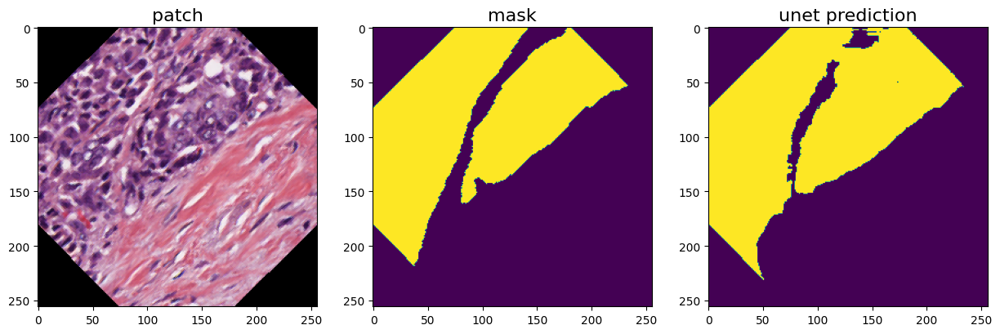

In [17]:
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,3,1)
train_or_val = 'val'
i = random.randint(0, dataset[train_or_val].nitems - 1) # randomly select a patch
(img, patch_mask)=dataset[train_or_val][i]
ax.set_title('patch', fontsize = 16)
ax.imshow(np.moveaxis(img.numpy(),0,-1))

ax = fig.add_subplot(1,3,2)
ax.imshow(patch_mask)
ax.set_title('mask', fontsize = 16)

img_tf = torch.tensor(np.expand_dims(img,axis=0))
X = img_tf.to(device)
prediction = model(X.float())
p=prediction[:,:,:,:].detach().cpu().numpy()
cpredflat=np.argmax(p,axis=1)

ax = fig.add_subplot(1,3,3)
ax.imshow(cpredflat[0,:,:])
ax.set_title('unet prediction', fontsize = 16)
fig

Now let's take a look at a whole slide validation image (1000 x 1000 x 3)

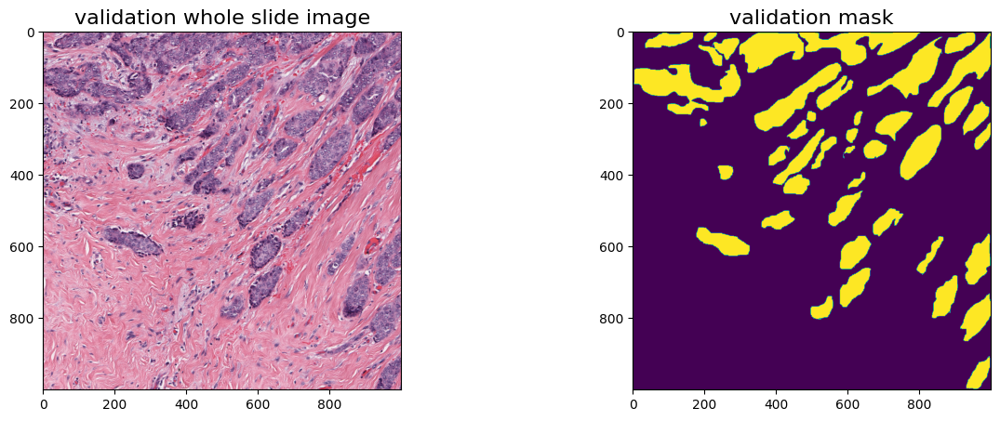

In [20]:
i = random.randint(0, val_table.root.filename.shape[0] - 1) # randomly select a patch
mask = val_table.root.filename[i].decode("utf-8")
image_id = re.search(r'(\d+)\_(\d+)', mask).group()
original = f'/content/drive/MyDrive/dl_tutorial/epithelium/epi/original/{image_id}.tif'
raw_img=cv2.cvtColor(cv2.imread(original),cv2.COLOR_BGR2RGB)
fig = Figure(figsize=(15,5))

ax = fig.add_subplot(1,2,1)
ax.set_title('validation whole slide image', fontsize = 16)
ax.imshow(raw_img)

mask_img=cv2.imread(mask, cv2.IMREAD_GRAYSCALE)
ax = fig.add_subplot(1,2,2)
ax.set_title('validation mask', fontsize = 16)
ax.imshow(mask_img)
fig

**Key step:** The UNet model inputs images of size 256 x 256 x 3. All whole slide images are of size 1000 x 1000 x 3. To segment a whole slide image, we'll have to follow the same procedure when we extracted training patches of size 500 x 500 x 3 and then reduced them to 256 x 256 x 3 for training.

We begin with padding the image using mirror reflection. This results in an image of size 1280 x 1280 x 3. Then we extract 256 x 256 x 3 patches with a stride size of 128 and predict/segment them. Next, we bring those patches together to recreate a mask of size 1280 x 1280. Finally, we trim off the edges to get the mask of right size 1000 x 1000.

In [21]:
resize = 1
patch_size = 256 # should match UNet input size
stride_size = patch_size//2

In [22]:
# pad image using reflection to predict edges correctly
io = np.pad(raw_img, [(stride_size//2, stride_size//2), (stride_size//2, stride_size//2), (0, 0)], mode="reflect")
io_shape_wpad = np.array(io.shape)
npad0 = int(np.ceil(io_shape_wpad[0] / patch_size) * patch_size - io_shape_wpad[0])
npad1 = int(np.ceil(io_shape_wpad[1] / patch_size) * patch_size - io_shape_wpad[1])

io = np.pad(io, [(0, npad0), (0, npad1), (0, 0)], mode="constant")
io.shape

(1280, 1280, 3)

In [23]:
ntiles = (io.shape[0]//stride_size) - 1 # number of tiles of size 256 x 256 x 3
segmentations_patches = np.zeros((ntiles, ntiles, patch_size, patch_size)) # saving masks for each tile
# iterating over tiles in x direction
for x in range(ntiles):
  start_x = x*stride_size
  # iterating over tiles in y direction
  for y in range(ntiles):
    #print(start, start+patch_size)
    start_y = y*stride_size
    # extract tile given the start position and patch size
    patches = io[start_x:start_x+patch_size, start_y:start_y+patch_size, :]
    # convert to tensor
    patches_tf = torch.tensor(np.expand_dims(patches,axis=0).transpose(0,3,1,2)/255)
    # send to GPU
    X = patches_tf.to(device)
    # predict/segment tile using trained model
    prediction = model(X.float())
    # save predictions on CPU
    p=prediction[:,:,:,:].detach().cpu().numpy()
    # convert probabilities to binary
    cpredflat=np.argmax(p,axis=1)
    # add mask to the larger matrix containing all masks
    segmentations_patches[x,y,:,:] = cpredflat[0,:,:]

In [24]:
# initializing a matrix of size 1280 x 1280
segmentations_whole_slide = np.zeros((io.shape[0],io.shape[1]))
# iterating over tiles in x direction
for x in range(ntiles):
  start_x = x*stride_size
  # iterating over tiles in y direction
  for y in range(ntiles):
    start_y = y*stride_size
    # add mask to matrix of size 1280 x 1280
    segmentations_whole_slide[start_x:start_x+patch_size, start_y:start_y+patch_size] += segmentations_patches[x,y]

In [29]:
# trimming off the padding on the edges

# output array of original dimension 1000 x 1000
out = np.zeros_like(mask_img)
# star x position of the final mask
x0 = stride_size//2
# end x position of the final mask
x1 = x0 + mask_img.shape[0]
# star y position of the final mask
y0 = stride_size//2
# end y position of the final mask
y1 = y0 + mask_img.shape[1]
# final mask
out = segmentations_whole_slide[x0: x1, y0: y1]
# overlapping tiles will yield pixel values > 1. Setting all such values to 1.
out = np.where(out >= 1, 1, 0)

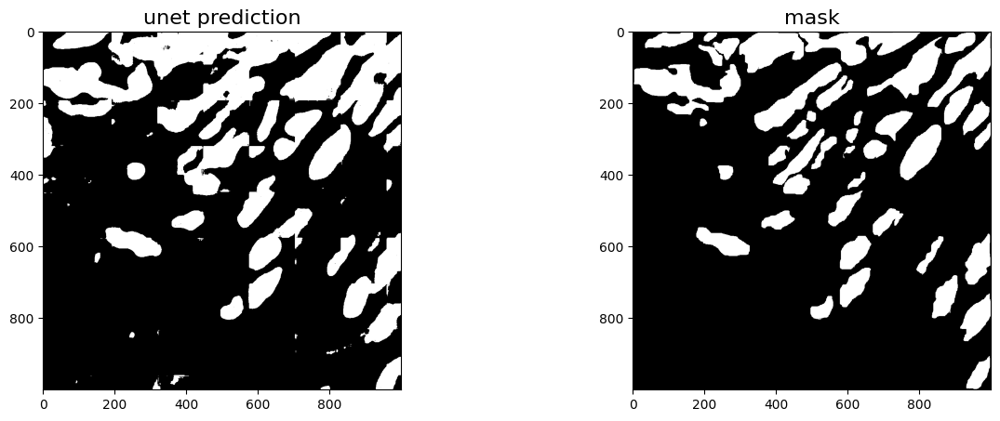

In [30]:
fig = Figure(figsize=(15,5))

ax = fig.add_subplot(1,2,1)
ax.imshow(out, cmap='Greys_r')
ax.set_title('unet prediction',fontsize=16)

ax = fig.add_subplot(1,2,2)
ax.imshow(mask_img,  cmap='Greys_r')
ax.set_title('mask',fontsize=16)

fig

In [31]:
dice = np.sum(out[mask_img/255==1])*2.0 / (np.sum(out) + np.sum(mask_img//255))
print('prediction metric (Dice score) = ', round(dice,2))

prediction metric (Dice score) =  0.83


In [18]:
%load_ext tensorboard

In [19]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>